In [44]:
library(Seurat)
library(ggplot2)
library(wesanderson)
library(ggcorrplot)
library(ggpubr)
library(tidyverse)
library(geneBasisR)
library(patchwork)

In [23]:
source(paste0("../00_preprocessing/preprocessing.R"))
source(paste0("../01_milo/milo.R"))
source(paste0("../genebasisr/genebasisr.R"))
source(paste0("../genebasisr/prep_probe_selection.R"))

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘matrixStats’


The following object is masked from ‘package:dplyr’:

    count



Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, 

In [18]:
exp_all_n1xo = qs::qread('_targets/objects/exp_all_n1xo')
exp_all_n1xo

An object of class Seurat 
57395 features across 27188 samples within 3 assays 
Active assay: SCT (25074 features, 3000 variable features)
 2 other assays present: RNA, integrated
 2 dimensional reductions calculated: pca, umap

In [19]:
exp_other_obob5v5 = qs::qread('_targets/objects/exp_other_obob5v5')
exp_other_obob5v5

An object of class Seurat 
54939 features across 13594 samples within 3 assays 
Active assay: SCT (22618 features, 3000 variable features)
 2 other assays present: RNA, integrated
 2 dimensional reductions calculated: pca, umap

In [20]:
exp_neuron_1xo = qs::qread('_targets/objects/exp_neuron_1xo')
exp_neuron_1xo

An object of class Seurat 
56603 features across 13594 samples within 3 assays 
Active assay: SCT (24282 features, 3000 variable features)
 2 other assays present: RNA, integrated
 2 dimensional reductions calculated: pca, umap

In [24]:
run_list = list(other = list(gs100_run_name = 'litgenes_all_n1xo_nosct__select_batch.cell_class___eval.other__predict.polar_label__eval_batch.none',
                             gs85_run_name = 'gs85_litgenes_other__select_batch.none___eval.other__predict.polar_label__eval_batch.none'),
                neuron_1xo = list(gs100_run_name = 'litgenes_all_n1xo_nosct__select_batch.cell_class___eval.neuron_1xo__predict.polar_label__eval_batch.none',
                                  gs85_run_name = 'gs85_litgenes_other__select_batch.none___eval.neuron_1xo__predict.polar_label__eval_batch.none'),
                all_n1xo = list(gs100_run_name = 'litgenes_all_n1xo_nosct__select_batch.cell_class___eval.all_n1xo__predict.polar_label__eval_batch.none',
                                gs85_run_name = 'gs85_litgenes_other__select_batch.none___eval.all_n1xo__predict.polar_label__eval_batch.none'))

In [25]:
eval_object = 'other'
gs100_run_name = run_list[[eval_object]]$gs100_run_name
gs85_run_name = run_list[[eval_object]]$gs85_run_name

In [26]:
gs100_path = paste0('_targets/objects/genes_stat_reranked_', gs100_run_name)
gs100_genes_stat = qs::qread(gs100_path)

In [27]:
gs85_path = paste0('_targets/objects/genes_stat_100_gs85_', gs85_run_name)
gs85_genes_stat = qs::qread(gs85_path)

In [28]:
exp_all_n1xo_gs100 = subset_seurat_obj_genes(exp_all_n1xo, gs100_genes_stat$gene) %>% sc_transform_fgf1

vst.flavor='v2' set, setting model to use fixed slope and exclude poisson genes.

Calculating cell attributes from input UMI matrix: log_umi

Total Step 1 genes: 100

Total overdispersed genes: 100

Excluding 0 genes from Step 1 because they are not overdispersed.

Variance stabilizing transformation of count matrix of size 100 by 27188

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 100 genes, 5000 cells



  |======================================================================| 100%


Setting estimate of  0 genes to inf as theta_mm/theta_mle < 1e-3

# of step1 poisson genes (variance < mean): 0

# of low mean genes (mean < 0.001): 0

Total # of Step1 poisson genes (theta=Inf; variance < mean): 0

Total # of poisson genes (theta=Inf; variance < mean): 0

Calling offset model for all 0 poisson genes

Ignoring theta inf genes

Replacing fit params for 0 poisson genes by theta=Inf

Setting min_variance based on median UMI:  5.76

Second step: Get residuals using fitted parameters for 100 genes



  |======================================================================| 100%


Computing corrected count matrix for 100 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 6.548235 secs

Determine variable features

Place corrected count matrix in counts slot

Regressing out batch

Centering data matrix

Set default assay to SCT

Warning message:
"Invalid name supplied, making object name syntactically valid. New object name is Seurat..SCTransform.RNA; see ?make.names for more details on syntax validity"
Warning message in irlba(A = t(x = object), nv = npcs, ...):
"You're computing too large a percentage of total singular values, use a standard svd instead."
Warning message:
"The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session"
11:05:58 UMAP embedding parameters a = 0.9922 b = 1.112

11:05:58 Read 27188 rows and found 30 numeric columns

11:05:58 Using Annoy for neighbor search

In [29]:
exp_all_n1xo_gs85 = subset_seurat_obj_genes(exp_all_n1xo, gs85_genes_stat$gene) %>% sc_transform_fgf1

vst.flavor='v2' set, setting model to use fixed slope and exclude poisson genes.

Calculating cell attributes from input UMI matrix: log_umi

Total Step 1 genes: 100

Total overdispersed genes: 100

Excluding 0 genes from Step 1 because they are not overdispersed.

Variance stabilizing transformation of count matrix of size 100 by 27188

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 100 genes, 5000 cells



  |======================================================================| 100%


Setting estimate of  0 genes to inf as theta_mm/theta_mle < 1e-3

# of step1 poisson genes (variance < mean): 0

# of low mean genes (mean < 0.001): 0

Total # of Step1 poisson genes (theta=Inf; variance < mean): 0

Total # of poisson genes (theta=Inf; variance < mean): 0

Calling offset model for all 0 poisson genes

Ignoring theta inf genes

Replacing fit params for 0 poisson genes by theta=Inf

Setting min_variance based on median UMI:  4.84

Second step: Get residuals using fitted parameters for 100 genes



  |======================================================================| 100%


Computing corrected count matrix for 100 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 4.891768 secs

Determine variable features

Place corrected count matrix in counts slot

Regressing out batch

Centering data matrix

Set default assay to SCT

Warning message:
"Invalid name supplied, making object name syntactically valid. New object name is Seurat..SCTransform.RNA; see ?make.names for more details on syntax validity"
Warning message in irlba(A = t(x = object), nv = npcs, ...):
"You're computing too large a percentage of total singular values, use a standard svd instead."
11:07:37 UMAP embedding parameters a = 0.9922 b = 1.112

11:07:37 Read 27188 rows and found 30 numeric columns

11:07:37 Using Annoy for neighbor search, n_neighbors = 30

11:07:37 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

In [30]:
exp_neuron_1xo_gs100 = subset_seurat_obj_genes(exp_neuron_1xo, gs100_genes_stat$gene) %>% sc_transform_fgf1

vst.flavor='v2' set, setting model to use fixed slope and exclude poisson genes.

Calculating cell attributes from input UMI matrix: log_umi

Total Step 1 genes: 100

Total overdispersed genes: 100

Excluding 0 genes from Step 1 because they are not overdispersed.

Variance stabilizing transformation of count matrix of size 100 by 13594

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 100 genes, 5000 cells



  |======================================================================| 100%


Setting estimate of  0 genes to inf as theta_mm/theta_mle < 1e-3

# of step1 poisson genes (variance < mean): 0

# of low mean genes (mean < 0.001): 0

Total # of Step1 poisson genes (theta=Inf; variance < mean): 0

Total # of poisson genes (theta=Inf; variance < mean): 0

Calling offset model for all 0 poisson genes

Found 1 outliers - those will be ignored in fitting/regularization step


Ignoring theta inf genes

Replacing fit params for 0 poisson genes by theta=Inf

Setting min_variance based on median UMI:  14.44

Second step: Get residuals using fitted parameters for 100 genes



  |======================================================================| 100%


Computing corrected count matrix for 100 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 4.629175 secs

Determine variable features

Place corrected count matrix in counts slot

Regressing out batch

Centering data matrix

Set default assay to SCT

Warning message:
"Invalid name supplied, making object name syntactically valid. New object name is Seurat..SCTransform.RNA; see ?make.names for more details on syntax validity"
Warning message in irlba(A = t(x = object), nv = npcs, ...):
"You're computing too large a percentage of total singular values, use a standard svd instead."
11:09:13 UMAP embedding parameters a = 0.9922 b = 1.112

11:09:13 Read 13594 rows and found 30 numeric columns

11:09:13 Using Annoy for neighbor search, n_neighbors = 30

11:09:13 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

In [31]:
exp_neuron_1xo_gs85 = subset_seurat_obj_genes(exp_neuron_1xo, gs85_genes_stat$gene) %>% sc_transform_fgf1

vst.flavor='v2' set, setting model to use fixed slope and exclude poisson genes.

Calculating cell attributes from input UMI matrix: log_umi

Total Step 1 genes: 100

Total overdispersed genes: 100

Excluding 0 genes from Step 1 because they are not overdispersed.

Variance stabilizing transformation of count matrix of size 100 by 13594

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 100 genes, 5000 cells



  |======================================================================| 100%


Setting estimate of  0 genes to inf as theta_mm/theta_mle < 1e-3

# of step1 poisson genes (variance < mean): 0

# of low mean genes (mean < 0.001): 0

Total # of Step1 poisson genes (theta=Inf; variance < mean): 0

Total # of poisson genes (theta=Inf; variance < mean): 0

Calling offset model for all 0 poisson genes

Found 1 outliers - those will be ignored in fitting/regularization step


Ignoring theta inf genes

Replacing fit params for 0 poisson genes by theta=Inf

Setting min_variance based on median UMI:  11.56

Second step: Get residuals using fitted parameters for 100 genes



  |======================================================================| 100%


Computing corrected count matrix for 100 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 5.122118 secs

Determine variable features

Place corrected count matrix in counts slot

Regressing out batch

Centering data matrix

Set default assay to SCT

Warning message:
"Invalid name supplied, making object name syntactically valid. New object name is Seurat..SCTransform.RNA; see ?make.names for more details on syntax validity"
Warning message in irlba(A = t(x = object), nv = npcs, ...):
"You're computing too large a percentage of total singular values, use a standard svd instead."
11:10:03 UMAP embedding parameters a = 0.9922 b = 1.112

11:10:03 Read 13594 rows and found 30 numeric columns

11:10:03 Using Annoy for neighbor search, n_neighbors = 30

11:10:03 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

In [32]:
exp_other_obob5v5_gs100 = subset_seurat_obj_genes(exp_other_obob5v5, gs100_genes_stat$gene) %>% sc_transform_fgf1

vst.flavor='v2' set, setting model to use fixed slope and exclude poisson genes.

Calculating cell attributes from input UMI matrix: log_umi

Total Step 1 genes: 100

Total overdispersed genes: 100

Excluding 0 genes from Step 1 because they are not overdispersed.

Variance stabilizing transformation of count matrix of size 100 by 13594

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 100 genes, 5000 cells



  |======================================================================| 100%


Setting estimate of  0 genes to inf as theta_mm/theta_mle < 1e-3

# of step1 poisson genes (variance < mean): 0

# of low mean genes (mean < 0.001): 0

Total # of Step1 poisson genes (theta=Inf; variance < mean): 0

Total # of poisson genes (theta=Inf; variance < mean): 0

Calling offset model for all 0 poisson genes

Ignoring theta inf genes

Replacing fit params for 0 poisson genes by theta=Inf

Setting min_variance based on median UMI:  1.44

Second step: Get residuals using fitted parameters for 100 genes



  |======================================================================| 100%


Computing corrected count matrix for 100 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 4.13767 secs

Determine variable features

Place corrected count matrix in counts slot

Regressing out batch

Centering data matrix

Set default assay to SCT

Warning message:
"Invalid name supplied, making object name syntactically valid. New object name is Seurat..SCTransform.RNA; see ?make.names for more details on syntax validity"
Warning message in irlba(A = t(x = object), nv = npcs, ...):
"You're computing too large a percentage of total singular values, use a standard svd instead."
11:10:51 UMAP embedding parameters a = 0.9922 b = 1.112

11:10:51 Read 13594 rows and found 30 numeric columns

11:10:51 Using Annoy for neighbor search, n_neighbors = 30

11:10:51 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*


In [33]:
exp_other_obob5v5_gs85 = subset_seurat_obj_genes(exp_other_obob5v5, gs85_genes_stat$gene) %>% sc_transform_fgf1

vst.flavor='v2' set, setting model to use fixed slope and exclude poisson genes.

Calculating cell attributes from input UMI matrix: log_umi

Total Step 1 genes: 100

Total overdispersed genes: 100

Excluding 0 genes from Step 1 because they are not overdispersed.

Variance stabilizing transformation of count matrix of size 100 by 13594

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 100 genes, 5000 cells



  |======================================================================| 100%


Setting estimate of  0 genes to inf as theta_mm/theta_mle < 1e-3

# of step1 poisson genes (variance < mean): 0

# of low mean genes (mean < 0.001): 0

Total # of Step1 poisson genes (theta=Inf; variance < mean): 0

Total # of poisson genes (theta=Inf; variance < mean): 0

Calling offset model for all 0 poisson genes

Ignoring theta inf genes

Replacing fit params for 0 poisson genes by theta=Inf

Setting min_variance based on median UMI:  1.44

Second step: Get residuals using fitted parameters for 100 genes



  |======================================================================| 100%


Computing corrected count matrix for 100 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 4.327552 secs

Determine variable features

Place corrected count matrix in counts slot

Regressing out batch

Centering data matrix

Set default assay to SCT

Warning message:
"Invalid name supplied, making object name syntactically valid. New object name is Seurat..SCTransform.RNA; see ?make.names for more details on syntax validity"
Warning message in irlba(A = t(x = object), nv = npcs, ...):
"You're computing too large a percentage of total singular values, use a standard svd instead."
11:11:42 UMAP embedding parameters a = 0.9922 b = 1.112

11:11:42 Read 13594 rows and found 30 numeric columns

11:11:42 Using Annoy for neighbor search, n_neighbors = 30

11:11:42 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

In [39]:
p_umap_clusters_exp_all_n1xo = DimPlot(exp_all_n1xo, reduction = "umap", group.by = "labels", label = TRUE) + theme(legend.position="none")
p_umap_clusters_exp_all_n1xo_gs100 = DimPlot(exp_all_n1xo_gs100, reduction = "umap", group.by = "labels", label = TRUE) + theme(legend.position="none")
p_umap_clusters_exp_all_n1xo_gs85 = DimPlot(exp_all_n1xo_gs85, reduction = "umap", group.by = "labels", label = TRUE)+ theme(legend.position="none")
p_umap_clusters_exp_neuron_1xo = DimPlot(exp_neuron_1xo, reduction = "umap", group.by = "labels", label = TRUE)+ theme(legend.position="none")
p_umap_clusters_exp_neuron_1xo_gs100 = DimPlot(exp_neuron_1xo_gs100, reduction = "umap", group.by = "labels", label = TRUE)+ theme(legend.position="none")
p_umap_clusters_exp_neuron_1xo_gs85 = DimPlot(exp_neuron_1xo_gs85, reduction = "umap", group.by = "labels", label = TRUE)+ theme(legend.position="none")
p_umap_clusters_exp_other_obob5v5 = DimPlot(exp_other_obob5v5, reduction = "umap", group.by = "labels", label = TRUE)+ theme(legend.position="none")
p_umap_clusters_exp_other_obob5v5_gs100 = DimPlot(exp_other_obob5v5_gs100, reduction = "umap", group.by = "labels", label = TRUE)+ theme(legend.position="none")
p_umap_clusters_exp_other_obob5v5_gs85 = DimPlot(exp_other_obob5v5_gs85, reduction = "umap", group.by = "labels", label = TRUE)+ theme(legend.position="none")

In [40]:
p_umap_treatment_exp_all_n1xo = DimPlot(exp_all_n1xo, reduction = "umap", group.by = "treatment") + theme(legend.position="none")
p_umap_treatment_exp_all_n1xo_gs100 = DimPlot(exp_all_n1xo_gs100, reduction = "umap", group.by = "treatment") + theme(legend.position="none")
p_umap_treatment_exp_all_n1xo_gs85 = DimPlot(exp_all_n1xo_gs85, reduction = "umap", group.by = "treatment")+ theme(legend.position="none")
p_umap_treatment_exp_neuron_1xo = DimPlot(exp_neuron_1xo, reduction = "umap", group.by = "treatment")+ theme(legend.position="none")
p_umap_treatment_exp_neuron_1xo_gs100 = DimPlot(exp_neuron_1xo_gs100, reduction = "umap", group.by = "treatment")+ theme(legend.position="none")
p_umap_treatment_exp_neuron_1xo_gs85 = DimPlot(exp_neuron_1xo_gs85, reduction = "umap", group.by = "treatment")+ theme(legend.position="none")
p_umap_treatment_exp_other_obob5v5 = DimPlot(exp_other_obob5v5, reduction = "umap", group.by = "treatment")+ theme(legend.position="none")
p_umap_treatment_exp_other_obob5v5_gs100 = DimPlot(exp_other_obob5v5_gs100, reduction = "umap", group.by = "treatment")+ theme(legend.position="none")
p_umap_treatment_exp_other_obob5v5_gs85 = DimPlot(exp_other_obob5v5_gs85, reduction = "umap", group.by = "treatment")+ theme(legend.position="none")

In [46]:
layout <- c(area(1, 1, 1, 1),
            area(1, 2, 1, 2),
            area(1, 3, 1, 3),
            area(2, 1, 2, 1),
            area(2, 2, 2, 2),
            area(2, 3, 2, 3)
            )

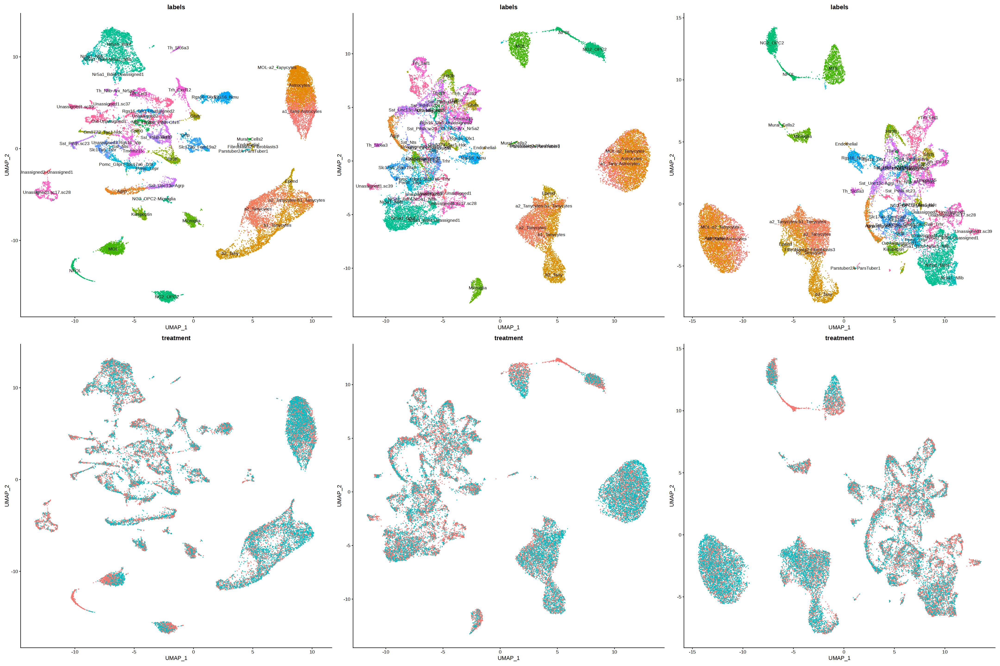

In [61]:
options(repr.plot.width=36, repr.plot.height=24)
p_umap_clusters_exp_all_n1xo + p_umap_clusters_exp_all_n1xo_gs100 + p_umap_clusters_exp_all_n1xo_gs85 + 
p_umap_treatment_exp_all_n1xo + p_umap_treatment_exp_all_n1xo_gs100 + p_umap_treatment_exp_all_n1xo_gs85 +
  plot_layout(design = layout)

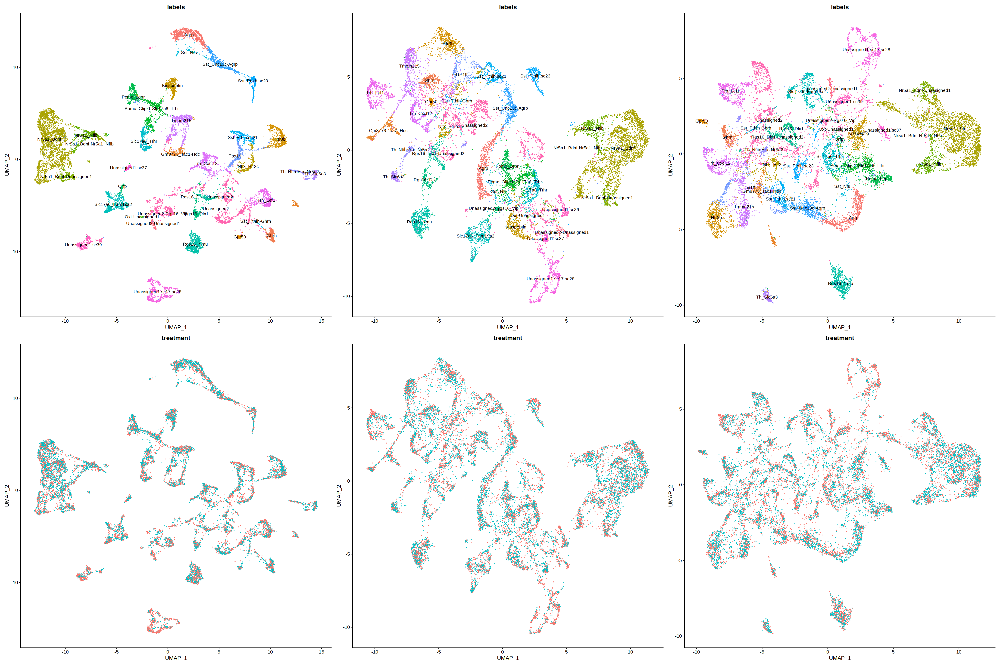

In [62]:
options(repr.plot.width=36, repr.plot.height=24)
p_umap_clusters_exp_neuron_1xo + p_umap_clusters_exp_neuron_1xo_gs100 + p_umap_clusters_exp_neuron_1xo_gs85 + 
p_umap_treatment_exp_neuron_1xo + p_umap_treatment_exp_neuron_1xo_gs100 + p_umap_treatment_exp_neuron_1xo_gs85 +
  plot_layout(design = layout)

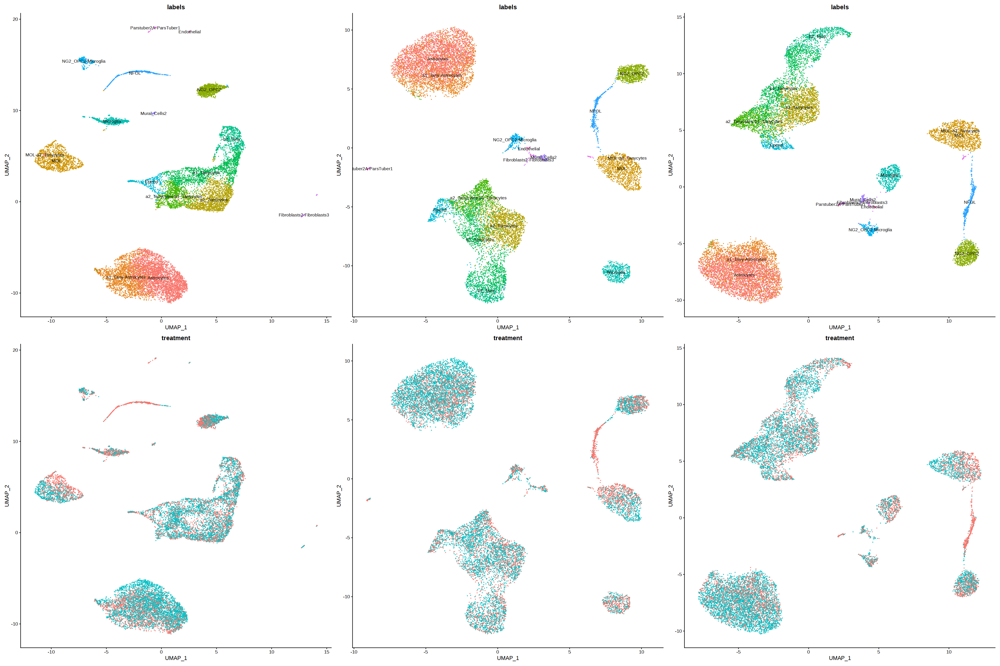

In [63]:
options(repr.plot.width=36, repr.plot.height=24)
p_umap_clusters_exp_other_obob5v5 + p_umap_clusters_exp_other_obob5v5_gs100 + p_umap_clusters_exp_other_obob5v5_gs85 + 
p_umap_treatment_exp_other_obob5v5 + p_umap_treatment_exp_other_obob5v5_gs100 + p_umap_treatment_exp_other_obob5v5_gs85 +
  plot_layout(design = layout)

In [66]:

g1 = gs85_genes_stat[1:25,]
g2 = gs85_genes_stat[26:50,]
g3 = gs85_genes_stat[51:75,]
g4 = gs85_genes_stat[76:100,]

In [68]:
dim(g1)

[1] 25  2

In [87]:
options(repr.plot.width=100, repr.plot.height=100)
DefaultAssay(exp_all_n1xo) = "SCT"
# Feature plot - visualize feature expression in low-dimensional space
p_exp_all_n1xo = FeaturePlot(exp_all_n1xo, features = gs85_genes_stat$gene, 
            ncol = 10,
            min.cutoff="q01",
            max.cutoff="q99",
            slot="counts", 
            order=TRUE)

In [88]:
ggsave("p_exp_all_n1xo.png", plot=p_exp_all_n1xo, device="png", width=12000, height=12000, units=c("px"))

In [76]:
exp_04 = qs::qread('../00_preprocessing/_targets/objects/exp_04')

In [84]:
exp_labelled_other = qs::qread('../00_preprocessing/_targets/objects/exp_labelled_other')

In [80]:
DefaultAssay(exp_04) = "SCT"
p_exp_04 = FeaturePlot(exp_04, features = gs85_genes_stat$gene, 
            ncol = 10,
            min.cutoff="q01",
            max.cutoff="q99",
            slot="counts", 
            order=TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To di

In [85]:
DefaultAssay(exp_labelled_other) = "SCT"
p_exp_labelled_other = FeaturePlot(exp_labelled_other, features = gs85_genes_stat$gene, 
            ncol = 10,
            min.cutoff="q01",
            max.cutoff="q99",
            slot="counts", 
            order=TRUE)

In [83]:
ggsave("p_exp_04.png", plot=p_exp_04, device="png", width=12000, height=12000, units=c("px"))

In [86]:
ggsave("p_exp_labelled_other.png", plot=p_exp_labelled_other, device="png", width=12000, height=12000, units=c("px"))

In [105]:
gs85_genes_stat %>% pull(gene) %>% paste0(sep="\n") %>% cat

Nrg3
 Plp1
 Aqp4
 Htr3b
 Rax
 Rbfox1
 Il1rapl2
 Robo1
 Kcnip4
 Sgcz
 Fgf13
 Cntn4
 Egfem1
 Gpc6
 Hdac9
 Col25a1
 Dcc
 Nkain2
 Pcdh11x
 Prkg1
 Pdgfra
 Prr16
 Kctd16
 Nrxn3
 Pde10a
 Plcl1
 Nrg1
 Rtl4
 Bmp4
 Grm7
 Ptprk
 Sgcd
 Ncam2
 Zfhx3
 Erbb4
 Kirrel3
 Nxph1
 Mgat4c
 Oxr1
 Sorcs1
 Pcdh7
 Adarb2
 Csmd1
 Inpp4b
 Ptprt
 Trpm3
 Tenm3
 Tox
 Alcam
 Car10
 Ntm
 Slit2
 Plxdc2
 Tenm2
 Luzp2
 Ptprd
 Lrp1b
 Sox5
 Brinp3
 Pcdh9
 Cacna2d3
 Rmst
 Rgs6
 Fat3
 Cadm2
 Pde4b
 Gpc5
 Cfap299
 Gria1
 Arhgap6
 Pdzrn3
 P3h2
 Kcnq3
 Plcb1
 Deptor
 Agrp
 Pomc
 Lef1
 Lmx1a
 Cntn5
 Lingo2
 Zfp804b
 Galntl6
 Grm8
 Hs3st4
 Fhit
 Wwox
 Immp2l
 Lrmda
 Macrod2
 Gtdc1
 Naaladl2
 Nalf1
 Slc1a2
 Ctnna2
 Grid2
 Slc7a11
 Sprr2a2
 Prkca
 Gabrg3


In [106]:
gs85_genes_stat

rank,gene
<int>,<chr>
1,Nrg3
2,Plp1
3,Aqp4
4,Htr3b
5,Rax
6,Rbfox1
7,Il1rapl2
8,Robo1
9,Kcnip4
